# <a href="https://miptstats.github.io/courses/ad_fivt.html">Введение в анализ данных</a>
## Домашнее задание 2. Простой анализ данных.

**Правила, <font color="red">прочитайте внимательно</font>:**

* Выполненную работу нужно отправить телеграм-боту `@miptstats_ds23_bot`. Для начала работы с ботом каждый раз отправляйте `/start`. Дождитесь подтверждения от бота, что он принял файл. Если подтверждения нет, то что-то не так. **Работы, присланные иным способом, не принимаются.**
* Дедлайн см. в боте. После дедлайна работы не принимаются кроме случаев наличия уважительной причины.
* Прислать нужно **ноутбук в формате `ipynb`** и html-версии графиков (подробности в условии).
* Телеграм не разрешает боту получать файлы более **20 Мб**. Если ваше решение весит больше, *заранее* разделите ноутбук на несколько.
* Выполнять задание необходимо полностью самостоятельно. **При обнаружении списывания все участники списывания будут сдавать устный зачет.**
* Решения, размещенные на каких-либо интернет-ресурсах, не принимаются. Кроме того, публикация решения в открытом доступе может быть приравнена к предоставлении возможности списать.
* Для выполнения задания **используйте этот ноутбук в качестве основы, ничего не удаляя из него**. Можно добавлять необходимое количество ячеек.
* Комментарии к решению пишите в markdown-ячейках.
* Выполнение задания (ход решения, выводы и пр.) должно быть осуществлено на русском языке.
* Если код будет не понятен проверяющему, оценка может быть снижена.
* Никакой код из данного задания при проверке запускаться не будет. *Если код студента не выполнен, недописан и т.д., то он не оценивается.*
* **Код из рассказанных на занятиях ноутбуков** можно использовать без ограничений.

**Перед выполнением задания посмотрите презентацию по выполнению и оформлению домашних заданий с занятия 1.**

---

**Баллы за задание:**

<b><font color="orange">Сложная часть</font></b> (необходимо на "отл"):
* Задача 2 &mdash; 80 баллов

---

In [1]:
# Bot check

# HW_ID: fpmi_ad2
# Бот проверит этот ID и предупредит, если случайно сдать что-то не то

# Status: final
# Перед отправкой в финальном решении удали "not" в строчке выше
# Так бот проверит, что ты отправляешь финальную версию, а не промежуточную

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

sns.set(style='whitegrid', font_scale=1.3, palette='Set2')


---
### <font color="orange"><i>Сложная часть</i></font>

### Задача 2

<a target="_blank" href="https://www.yelp.com/">Yelp</a> — веб-сайт для поиска на местном рынке услуг, например ресторанов или парикмахерских, с возможностью добавлять и просматривать рейтинги и обзоры этих услуг. Для популярных бизнесов имеются сотни обзоров. Для обозревателей на сайте предусмотрены элементы социальной сети.

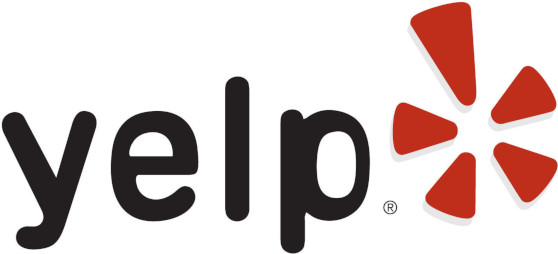

_____________

Вам предоставляется следующая информация о компаниях на Yelp:

Файл `yelp_business.csv`:
* `business_id` — уникальный идентификатор компании;
* `name` — имя компании;
* `address`, `city`, `state` — месторасположении компании;
* `latitude`, `longitude` — географические координаты;
* `categories` — категории услуг компании.

Файл `yelp_review.csv`, содержащий оценки пользователей:
* `business_id` — идентификатор компании, соответствующий файлу `yelp_business.csv`;
* `stars` — поставленная пользователем оценка от 1 до 5.

В целях сокращения объема файла, текстовые отзывы пользователей не были включены.

Оригинальную версию датасета в формате `json` можно посмотреть по <a target="_blank" href="https://www.kaggle.com/yelp-dataset/yelp-dataset/data">ссылке</a>, но использовать нужно выданные данные.

_____________

**Что нужно сделать:** 

* Найти город с наибольшим количеством компаний;
* Для этого города определить районы с наиболее качественными услугами. <a target="_blank" href="https://yandex.ru/company/researches/2017/msk_mobile_map">Пример</a> с несколько другой задачей.
* А также найти рестораны с наилучшими отзывами.


*Далее в условии встречаются различные подсказки, как можно выполнить определенные части задачи. Вы можете их игнорировать и делать иным способом для получения **того же самого промежуточного результата**. Однако, если ваше решение окажется **значительно** менее эффективным (по скорости, количеству и красоте кода) по сравнению с предполагаемым, баллы могут быть снижены.* 

------

#### 1. Город с наибольшим количеством компаний

Загрузите данные из файла `yelp_business.csv` с помощью функции `pd.read_csv`. Посмотрите на первые несколько строк с помощью метода `head`.

In [2]:
data_business = pd.read_csv('yelp_business.csv')
data_business.head(8)

,Unnamed: 0,business_id,name,neighborhood,address,city,state,postal_code,latitude,longitude,is_open,categories
0,0,FYWN1wneV18bWNgQjJ2GNg,"""Dental by Design""",NaN,"""4855 E Warner Rd, Ste B9""",Ahwatukee,AZ,85044,33.330690,-111.978599,1,Dentists;General Dentistry;Health & Medical;Or...
1,1,He-G7vWjzVUysIKrfNbPUQ,"""Stephen Szabo Salon""",NaN,"""3101 Washington Rd""",McMurray,PA,15317,40.291685,-80.104900,1,Hair Stylists;Hair Salons;Men's Hair Salons;Bl...
2,2,KQPW8lFf1y5BT2MxiSZ3QA,"""Western Motor Vehicle""",NaN,"""6025 N 27th Ave, Ste 1""",Phoenix,AZ,85017,33.524903,-112.115310,1,Departments of Motor Vehicles;Public Services ...
3,3,8DShNS-LuFqpEWIp0HxijA,"""Sports Authority""",NaN,"""5000 Arizona Mills Cr, Ste 435""",Tempe,AZ,85282,33.383147,-111.964725,0,Sporting Goods;Shopping
4,4,PfOCPjBrlQAnz__NXj9h_w,"""Brick House Tavern + Tap""",NaN,"""581 Howe Ave""",Cuyahoga Falls,OH,44221,41.119535,-81.475690,1,American (New);Nightlife;Bars;Sandwiches;Ameri...
5,5,o9eMRCWt5PkpLDE0gOPtcQ,"""Messina""",NaN,"""Richterstr. 11""",Stuttgart,BW,70567,48.727200,9.147950,1,Italian;Restaurants
6,6,kCoE3jvEtg6UVz5SOD3GVw,"""BDJ Realty""",Summerlin,"""2620 Regatta Dr, Ste 102""",Las Vegas,NV,89128,36.207430,-115.268460,1,Real Estate Services;Real Estate;Home Services...
7,7,OD2hnuuTJI9uotcKycxg1A,"""Soccer Zone""",NaN,"""7240 W Lake Mead Blvd, Ste 4""",Las Vegas,NV,89128,36.197484,-115.249660,1,Shopping;Sporting Goods


Найдите пять городов, по которым присутствует информация о наибольшем количестве компаний. В таблице должен быть указан город (название) и количество компаний в этом городе.

*Подсказка.* Для выполнения стоит воспользоваться методами `groupby`, `count`, `sort_values`, `head`.

In [3]:
data_business.groupby(['city']).count().sort_values(by=['business_id'],ascending=False).head(5)

,Unnamed: 0,business_id,name,neighborhood,address,state,postal_code,latitude,longitude,is_open,categories
city,,,,,,,,,,,
Las Vegas,26775,26775,26775,21887,26775,26775,26655,26775,26775,26775,26775
Phoenix,17213,17213,17213,0,17213,17213,17121,17213,17213,17213,17213
Toronto,17206,17206,17206,14064,17206,17206,17102,17205,17205,17206,17206
Charlotte,8553,8553,8553,5844,8553,8553,8517,8553,8553,8553,8553
Scottsdale,8228,8228,8228,0,8228,8228,8201,8228,8228,8228,8228


Пусть `N` &mdash; город с наибольшим количеством компаний. Оставьте в таблице только записи, соответствующие городу `N`. Нанесите все эти компании на график, в котором по оси $x$ отметьте долготу, а по оси $y$ &mdash; широту.

<Axes: xlabel='longitude', ylabel='latitude'>

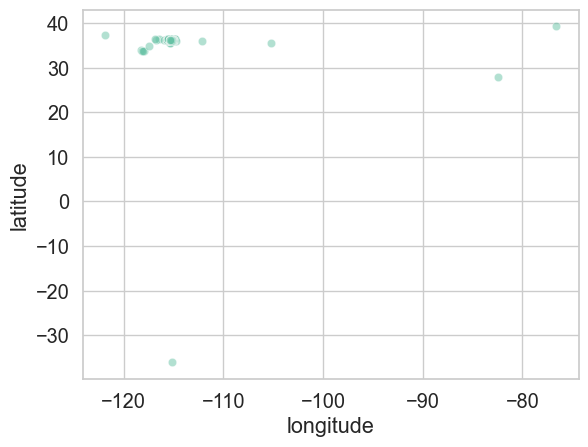

In [4]:
top_1_city_info = data_business.loc[data_business['city'] == 'Las Vegas']
sns.scatterplot(x='longitude', y='latitude', data=top_1_city_info, alpha = 0.5)

Сам город находится в сгустке точек. Есть какие-то компании, которые приписаны к этому городу, но находятся далеко от него. Избавьтесь от них, подобрав некоторые границы значений широты и долготы. Изобразите все компании на новом графике. На этом графике должны выделяться некоторые улицы.

<Axes: xlabel='longitude', ylabel='latitude'>

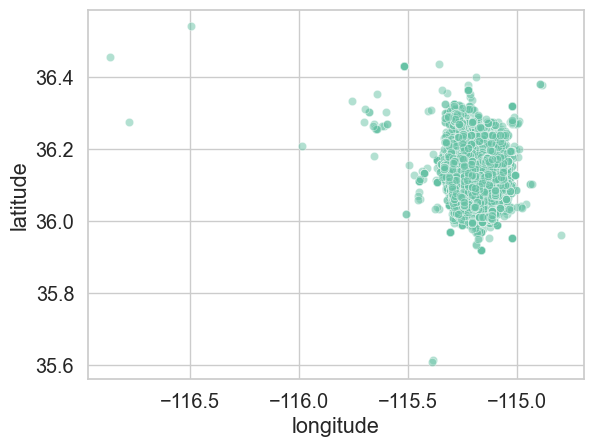

In [5]:
businesses_in_LV = top_1_city_info.loc[(top_1_city_info['longitude'] < -114) & (top_1_city_info['longitude'] > -117) & (top_1_city_info['latitude'] > 35)]
sns.scatterplot(x='longitude', y='latitude', data=businesses_in_LV, alpha = 0.5)

Разберитесь с тем, как подгрузить интерактивную карту города в качестве фона графика. Можно пойти двумя следующими способами.
1. Изучить <a href="https://miptstats.github.io/courses/python/11_plotly.html" target="_blank">материалы</a> по библиотеке <a href="https://plotly.com/python/" target="_blank"><b>Plotly</b></a>. Возможно, потребуется также заглянуть в документацию.
1. Поразбираться с библиотекой <a href="https://github.com/python-visualization/folium" target="_blank"><b>Folium</b></a>. Посмотрите множество <a href="https://nbviewer.org/github/python-visualization/folium/tree/main/examples/" target="_blank">примеров</a>, может также помочь <a href="https://proglib.io/p/python-web-map" target="_blank">статья на русском</a>.

*Внимание!* Интерактивная карта может не сохраниться в ноутбуке, а если сохранится, то вес ноутбука может превзойти 20 Мб, и его не получится отправить боту. В любом случае **<u>необходимо сохранить карту в html и отправить ее отдельным файлом в бот.</u>** При этом каждый файл html должен не превышать 20 Мб, присылать файлы в архиве нельзя. Аналогично со всеми следующими интерактивными графиками в этом задании.

In [6]:
import plotly.express as px

px.set_mapbox_access_token("pk.eyJ1IjoiZ3Jpc2hhbmNoZWwiLCJhIjoiY2xzdzF6bG5wMmh1NDJqbnM3MTFxd3JtNyJ9.IAFyJT0AtpA1fc64akjd-Q")
fig = px.scatter_mapbox(businesses_in_LV,
                        lat=businesses_in_LV['latitude'],
                        lon=businesses_in_LV['longitude'],
                        hover_name="name",
                        zoom=10)
fig.show()

fig.write_html("interactive_map1.html")

Если все получилось, вы молодцы! Далее в этой задаче тоже стройте интерактивные карты. Если нет желания разбираться с интерактивными графиками, можно построить статичные, но баллы будут снижены.

#### 2. Оценки компаний

Для выполнения задания нужно посчитать среднюю оценку каждой компании, а также количество выставленных оценок.

Загрузите таблицу оценок `yelp_review.csv`.

In [7]:
data_reviews = pd.read_csv('yelp_review.csv')
data_reviews.head(8)

,Unnamed: 0,business_id,stars
0,0,AEx2SYEUJmTxVVB18LlCwA,5
1,1,VR6GpWIda3SfvPC-lg9H3w,5
2,2,CKC0-MOWMqoeWf6s-szl8g,5
3,3,ACFtxLv8pGrrxMm6EgjreA,4
4,4,s2I_Ni76bjJNK9yG60iD-Q,4
5,5,8QWPlVQ6D-OExqXoaD2Z1g,5
6,6,9_CGhHMz8698M9-PkVf0CQ,4
7,7,gkCorLgPyQLsptTHalL61g,4


В подгруженной таблице оценок оставьте только компании города `N`. Для этого установите значения `business_id` в качестве индекса у таблицы оценок и воспользуйтесь методом `loc`. 

*Подсказка.* Чтобы индекс снова сделать полем таблицы, можно воспользоваться методом `reset_index`.

In [8]:
data_reviews.set_index('business_id', inplace=True)

filtered_data_reviews = data_reviews.loc[top_1_city_info['business_id']]

filtered_data_reviews.reset_index(inplace=True)

filtered_data_reviews

,business_id,Unnamed: 0,stars
0,kCoE3jvEtg6UVz5SOD3GVw,456053,4
1,kCoE3jvEtg6UVz5SOD3GVw,1093900,1
2,kCoE3jvEtg6UVz5SOD3GVw,2039047,5
3,kCoE3jvEtg6UVz5SOD3GVw,2979380,5
4,kCoE3jvEtg6UVz5SOD3GVw,4844650,5
...,...,...,...
1604222,9ouC6BpmjFpLfHeQnLQqng,4857506,5
1604223,9ouC6BpmjFpLfHeQnLQqng,5256464,5
1604224,n9a-3YhibkMDUEgncIivHg,779637,5
1604225,n9a-3YhibkMDUEgncIivHg,1222296,1


Теперь посчитайте среднюю оценку каждой компании, а также количество выставленных компании оценок. 

*Подсказка.* Помочь в этом могут функции `groupby` и `aggregate([np.mean, np.size])`.

In [9]:
avg_rating_data = filtered_data_reviews.groupby('business_id').agg({'stars': ['mean', 'size']})
avg_rating_data

stars      
                            mean  size
business_id                           
--9e1ONYQuAa-CB_Rrw7Tw  4.088904  1451
--DdmeR16TRb3LsjG0ejrQ  3.200000     5
--WsruI0IGEoeRmkErU5Gg  4.928571    14
--Y7NhBKzLTbNliMUX_wfg  4.875000     8
--e8PjCNhEz32pprnPhCwQ  3.473684    19
...                          ...   ...
zzOo9n22fBbKAhbSpMzggA  3.230769    26
zzXuJF6UUT1kgTyCsmgDmQ  5.000000     4
zzjqFOujmM9surbMANZ_ag  5.000000     3
zzsKbL1KMNJqazSqBXskxQ  3.666667     6
zzzaIBwimxVej4tY6qFOUQ  3.432432    37

[26775 rows x 2 columns]

Назовите колонки таблицы красивыми именами, изменив `<имя таблицы>.columns`, после чего напечатайте несколько строк полученной таблицы. Красивые имена &mdash; то, что будет понятно простому человеку при чтении ваших результатов. Как именно их назвать &mdash; задача аналитика, то есть в данном случае ваша :)

In [10]:
avg_rating_data.columns = ['Average Rating', 'Number of Ratings']
avg_rating_data

,Average Rating,Number of Ratings
business_id,,
--9e1ONYQuAa-CB_Rrw7Tw,4.088904,1451
--DdmeR16TRb3LsjG0ejrQ,3.200000,5
--WsruI0IGEoeRmkErU5Gg,4.928571,14
--Y7NhBKzLTbNliMUX_wfg,4.875000,8
--e8PjCNhEz32pprnPhCwQ,3.473684,19
...,...,...
zzOo9n22fBbKAhbSpMzggA,3.230769,26
zzXuJF6UUT1kgTyCsmgDmQ,5.000000,4
zzjqFOujmM9surbMANZ_ag,5.000000,3


Соедините две полученные ранее таблицы по компаниям города `N` в одну.
Для этого сначала установите поле `business_id` в качестве индекса в обеих таблицах с помощью `set_index`. В одной из них это уже должно было быть сделано.
В полученной таблице должны получится поля `latitude`, `longitude`, `categories`, `name`, а также две колонки со средней оценкой компаний и количеством оценок, которые вы посчитали выше.

*Подсказка.* Соединение таблиц можно выполнить с помощью `join`.
Индексы у этих таблиц одинаковые, так что тип джойна не имеет значения.

In [11]:
businesses_in_LV = businesses_in_LV.set_index('business_id')

final_table = avg_rating_data.join(businesses_in_LV, how='inner')

final_table


,Average Rating,Number of Ratings,Unnamed: 0,name,neighborhood,address,city,state,postal_code,latitude,longitude,is_open,categories
business_id,,,,,,,,,,,,,
--9e1ONYQuAa-CB_Rrw7Tw,4.088904,1451,90057,"""Delmonico Steakhouse""",The Strip,"""3355 Las Vegas Blvd S""",Las Vegas,NV,89109,36.123183,-115.169190,1,Cajun/Creole;Steakhouses;Restaurants
--DdmeR16TRb3LsjG0ejrQ,3.200000,5,104765,"""World Food Championships""",The Strip,"""3645 Las Vegas Blvd S""",Las Vegas,NV,89109,36.114277,-115.170975,1,Arts & Entertainment;Festivals
--WsruI0IGEoeRmkErU5Gg,4.928571,14,95522,"""Dial Carpet Cleaning""",Westside,"""3111 S Valley Vw, #H-104""",Las Vegas,NV,89102,36.130899,-115.190785,1,Carpet Cleaning;Local Services
--Y7NhBKzLTbNliMUX_wfg,4.875000,8,508,"""Pinnacle Restoration""",Spring Valley,"""""",Las Vegas,NV,89148,36.061235,-115.289685,1,Drywall Installation & Repair;Handyman;Home Se...
--e8PjCNhEz32pprnPhCwQ,3.473684,19,120281,"""Lucky's Pet Grooming & Boutique""",Downtown,"""1460 E Charleston Blvd""",Las Vegas,NV,89104,36.158851,-115.133272,1,Pets;Pet Groomers;Pet Services;Pet Stores
...,...,...,...,...,...,...,...,...,...,...,...,...,...
zzOo9n22fBbKAhbSpMzggA,3.230769,26,74755,"""Goodtimes Bar & Nightclub""",Southeast,"""1775 E Tropicana Ave""",Las Vegas,NV,89119,36.099328,-115.128494,0,Dance Clubs;Gay Bars;Nightlife;Bars
zzXuJF6UUT1kgTyCsmgDmQ,5.000000,4,157968,"""Sin City Spray Tans""",Southeast,"""7380 S Eastern Ave, Ste 109C""",Las Vegas,NV,89123,36.055602,-115.118218,0,Spray Tanning;Beauty & Spas;Tanning
zzjqFOujmM9surbMANZ_ag,5.000000,3,72250,"""American Express Open Business Lounge""",Eastside,"""460-798 E Desert Inn Rd""",Las Vegas,NV,89109,36.129838,-115.146037,1,Nightlife;Lounges;Bars


Изобразите все компании на графике, раскрасив точку в цвет, оттенок которого соответствует средней оценке компании. Прозрачность точки выставляйте не более $0.3$. Если у одной компании несколько филиалов с разными адресами, наносите на график все адреса.

In [39]:
px.set_mapbox_access_token("pk.eyJ1IjoiZ3Jpc2hhbmNoZWwiLCJhIjoiY2xzdzF6bG5wMmh1NDJqbnM3MTFxd3JtNyJ9.IAFyJT0AtpA1fc64akjd-Q")

fig = px.scatter_mapbox(final_table,
                        lat="latitude",
                        lon="longitude",
                        color="Average Rating",
                        size="Number of Ratings",
                        color_continuous_scale=px.colors.sequential.Viridis,
                        opacity=0.3,
                        hover_name="name",
                        zoom=10)

fig.show()

fig.write_html("interactive_map2.html")

Чтобы получить районы города, то есть разделить город на "клетки", округлите значения широты и долготы, подобрав оптимальный размер района. 

*Подсказка.* Например, можно сделать так
`np.round(долгота*4, decimals=1)*0.25`.

In [31]:
final_table['longitude'] = np.round(final_table['longitude']*4, decimals=1)*0.25
final_table['latitude'] = np.round(final_table['latitude']*4, decimals=1)*0.25

Для получения средней оценки компаний по району постройте сводную таблицу при помощи `pd.pivot_table`, взяв в качестве индексов и колонок округленные широту и долготу, а в качестве значений &mdash; оценки. Аггрегирующей функцией является среднее.

Изобразите полученную таблицу при помощи `sns.heatmap`.

*Замечание.* В качестве среднего можно было бы посчитать как общее среднее по всем оценкам всех компаний, так и среднее по компаниям их средних оценок. В чем разница этих подходов? Какой из них необходимо использовать в данном случае?

Общее среднее по всем оценкам всех компаний учитывает все оценки всех компаний при подсчете среднего.
Среднее по компаниям из их средних оценок учитывает только усредненные оценки каждой компании, а затем находит среднее этих усредненных оценок по району. В данном случае думаю более логично использовать среднее по компаниям из их средних оценок для получения уровня качества компаний в разных районах.

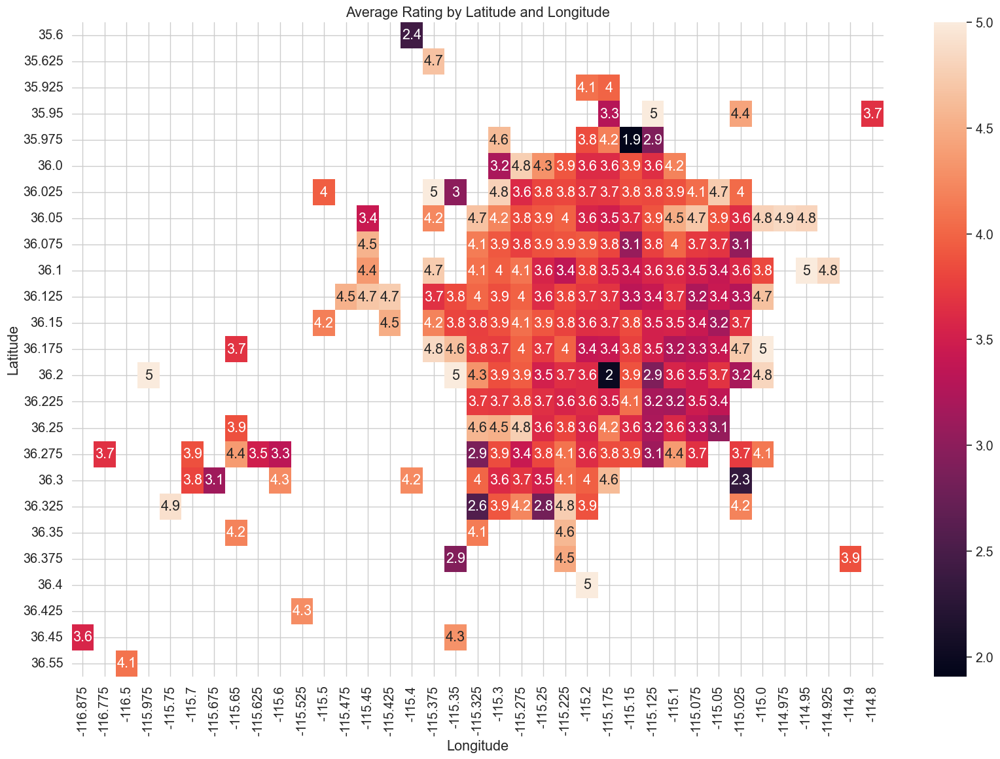

In [35]:
# pivot_table = pd.pivot_table(final_table, index=[final_table['latitude'].round(), np.round(final_table['longitude']*4, decimals=1)*0.25], values='Average Rating', aggfunc='mean')
#
# sns.heatmap(pivot_table)

pivot_table = final_table.pivot_table(index='latitude', columns='longitude', values='Average Rating', aggfunc='mean')
plt.figure(figsize=(20,13))
sns.heatmap(pivot_table, annot=True)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Average Rating by Latitude and Longitude')
plt.show()



Полученный график имеет ряд недостатков. Во-первых, не очень правильно судить о районе, если в нем мало компаний. Во-вторых, на графике цветовая гамма автоматически подстроилась под минимальное и максимальное значения оценки.

Почему эти недостатки могут быть существенными?

**Ответ:** <Если в районе есть всего одна компания с низкой оценкой, то это дает неверное представление о районе в целом, поэтому нужно увеличить входной порог количества мест в районе, чтобы точность оценки увеличивалась с увеличением количества компаний в районе>

Оставьте районы, в которых имеется информация о не менее $30$ компаний. Постройте новый график районов, использовав параметры `vmin` и `vmax` у функции `sns.heatmap`.

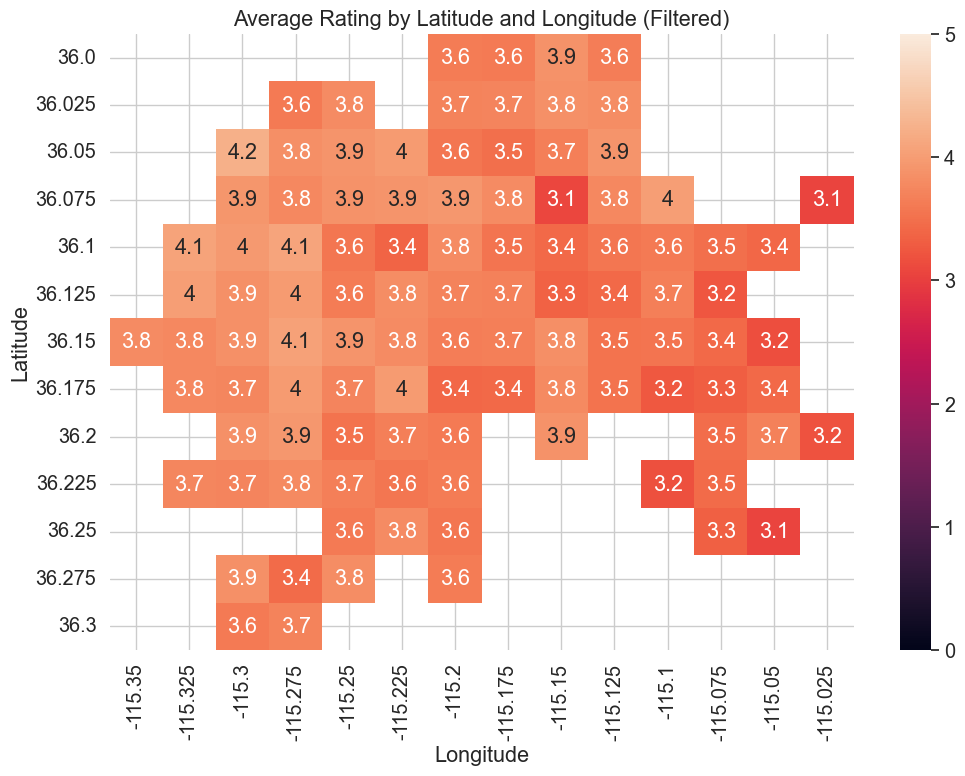

In [37]:
filtered_data = final_table.groupby(['latitude', 'longitude']).filter(lambda x: len(x) >= 30)

pivot_table = pd.pivot_table(filtered_data, index='latitude', columns='longitude', values='Average Rating', aggfunc='mean')

plt.figure(figsize=(12, 8))
sns.heatmap(pivot_table, annot=True, vmin=0, vmax=5)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Average Rating by Latitude and Longitude (Filtered)')
plt.show()

Сравните полученный график с предыдущим и сделайте вывод.

**Вывод:** <В данном случае переход цвета более сбалансированный, что отражает реальную картину с отзывами гораздо лучше, потому что нет выбросов в виде районов с маленьким количеством заведений>

#### 3. Рестораны

Будем считать компанию рестораном, если в поле `categories` *содержится* слово `restaurant`. Обратите внимание, что в анализе данных часто нет четкого формата данных. Например, данное слово может быть написано как с большой буквы, так и с маленькой; может как разделяться `;`, так и не разделяться. При возникновении недопонимания стоит посмотреть данные.

Составьте таблицу, в которой будет информация о всех ресторанах города `N`, для которых имеется не менее $5$ отзывов. Далее постройте heatmap-график районов, в котором каждому району сопоставьте среднюю оценку по ресторанам этого района. Рассматривайте только те районы, в которых есть не менее $10$ ресторанов, для каждого из которых есть не менее $5$ отзывов.

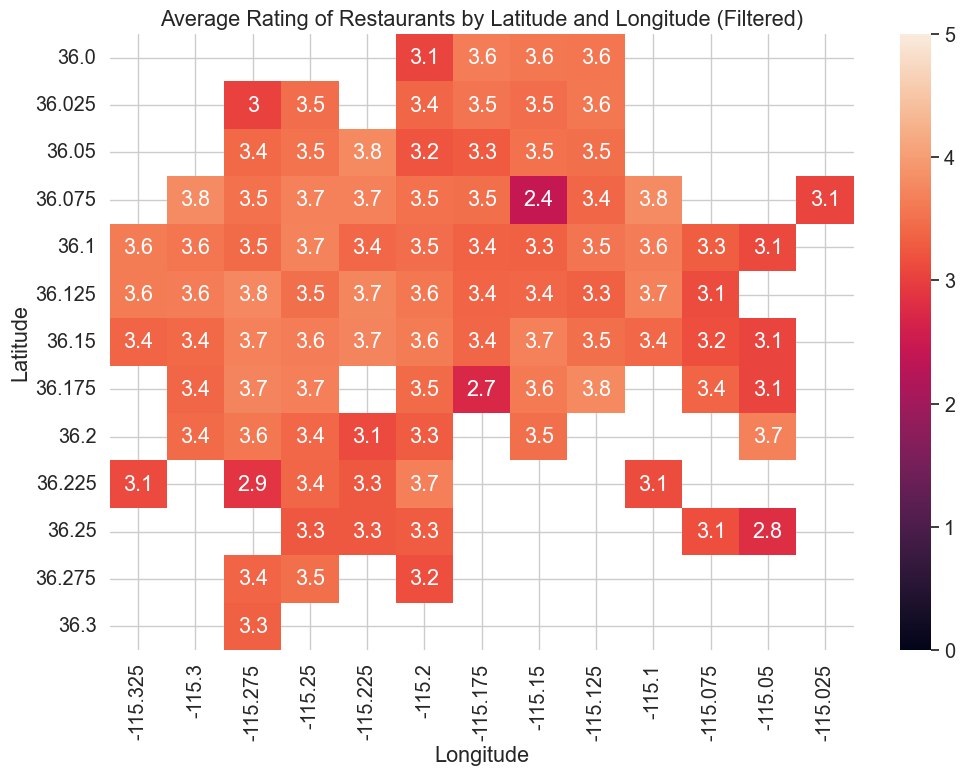

In [38]:
filtered_restaurants = final_table[(final_table['categories'].str.contains('restaurant', case=False)) & (final_table['Number of Ratings'] >= 5)]

filtered_grouped = filtered_restaurants.groupby(['latitude', 'longitude']).filter(lambda x: len(x) >= 10 and x['Number of Ratings'].count() >= 5)

pivot_table = pd.pivot_table(filtered_grouped, index='latitude', columns='longitude', values='Average Rating', aggfunc='mean')

plt.figure(figsize=(12, 8))
sns.heatmap(pivot_table, annot=True, vmin=0, vmax=5)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Average Rating of Restaurants by Latitude and Longitude (Filtered)')
plt.show()

Чем полезны ограничения снизу на количество отзывов для ресторана и количество ресторанов в районе?

**Ответ:** <Например если мы хотим найти ресторан в конкретном районе с хорошей репутацией, то подобные ограничения очень помогут, так как рестораны с маленьким количеством отзывов нерелевантны и мы не можем сказать о них что-то объективное>

Кот Василий из города `N` очень придирчив к выбору ресторана. Он доверяет только ресторанам с высоким рейтингом, который основывается на большом количестве отзывов. Напечатайте в виде таблицы информацию $10$ ресторанах с самым большим рейтингом в порядке убывания рейтинга. Для каждого из этих ресторанов должно быть не менее $50$ отзывов. По каждому ресторану необходимо вывести следующую информации: название ресторана, средняя оценка, количество отзывов, географические координаты, категории.

In [18]:
filtered_grouped.loc[filtered_grouped['Number of Ratings'] >= 50].sort_values(by='Average Rating', ascending=False)[['name', 'Average Rating', 'Number of Ratings', 'longitude', 'latitude', 'categories']].head(10)

,name,Average Rating,Number of Ratings,longitude,latitude,categories
business_id,,,,,,
iBPyahdJRP5y0t25fF2W9w,"""Lip Smacking Foodie Tours""",4.966480,179,-115.175,36.125,Food Tours;Restaurants;Event Planning & Servic...
Fmij544FE1iOruoxI41kew,"""Pepito Shack""",4.907692,65,-115.150,36.150,Restaurants;Burgers;Food Stands;Sandwiches;Hot...
qw9SyduMZ53KB6GlBQqvZQ,"""Bosa Boba Cafe""",4.890909,55,-115.175,36.125,Vietnamese;Bubble Tea;Sandwiches;Food;Coffee &...
k9b96JXlNewj36ddrce9Jw,"""Garden Grill""",4.868132,91,-115.275,36.175,Tacos;Street Vendors;Farmers Market;Vegetarian...
IhNASEZ3XnBHmuuVnWdIwA,"""Brew Tea Bar""",4.848069,1165,-115.250,36.050,Cafes;Tea Rooms;Food;Bubble Tea;Restaurants;De...
k5ddmLvAKKw9zSusRPM2cQ,"""Poppa Naps BBQ""",4.836538,104,-115.100,36.125,Food Stands;Hot Dogs;Caterers;Restaurants;Amer...
8fFTJBh0RB2EKG53ibiBKw,"""Zenaida's Cafe""",4.833333,180,-115.100,36.100,Restaurants;Breakfast & Brunch;Cafes
l1GJnB9TJgGgEeI4at1M0A,"""El Frescos Cocina Mexicana""",4.816754,191,-115.150,36.100,Caterers;Mexican;Restaurants;Food;Event Planni...
hFT3HuxVZJb1uYEsYfp-0A,"""Blaqcat Ultra Hookah Lounge""",4.809524,63,-115.225,36.150,Adult Entertainment;Lounges;Hookah Bars;Restau...


Нанесите на карту все рестораны со средней оценкой не менее $4.7$, которая посчитана по не менее $50$ отзывам. Отдельным цветом отметьте 10 ресторанов, которые вы получили ранее.

In [26]:
px.set_mapbox_access_token("pk.eyJ1IjoiZ3Jpc2hhbmNoZWwiLCJhIjoiY2xzdzF6bG5wMmh1NDJqbnM3MTFxd3JtNyJ9.IAFyJT0AtpA1fc64akjd-Q")

fig = px.scatter_mapbox(filtered_grouped[(filtered_grouped['Average Rating'] >= 4.7) & (filtered_grouped['Number of Ratings'] >= 50)],
                        lat="latitude",
                        lon="longitude",
                        color="Average Rating",
                        size="Number of Ratings",
                        color_continuous_scale=px.colors.sequential.Viridis,
                        opacity=0.3,
                        hover_name="name",
                        zoom=10)

fig.add_scattermapbox(lat=filtered_grouped.head(10)['latitude'],
                      lon=filtered_grouped.head(10)['longitude'],
                      mode='markers',
                      marker=dict(size=10, color='red'),
                      hovertext=filtered_grouped.head(10)['name'])

fig.show()

fig.write_html("interactive_map3.html")

Охарактеризуйте кота Василия, а также сделайте общий вывод по задаче.

**Вывод:** <Кот Василий очень избирателен касаемо выбора места для ужина. Анализ данных позволяет выявить лучшие рестораны среди множества вариантов, что может быть полезно при принятии решений о выборе места для посещения. Визуализация данных помогает делать выводы более наглядно и эффективно. >